## Jav-Nairobi: Equity Analysis

### i. Background

Jav (matatu) transit in Nairobi equity analysis is important for identifying gaps in coverage, especially in a city like Nairobi where informal systems like matatus serve the majority but often unevenly. I shall overlay population data with GTFS-derived stop/route buffers (e.g., 1/4 mile or ~400m walking distance) to compute coverage and accessibility metrics to align with standard transit equity frameworks. This can highlight underserved areas (e.g., wards with low % population coverage or few accessible routes), which could inform route expansions or subsidies for equity.

### ii. Libraries

In [2]:
import pandas as pd
import geopandas as gpd
import gtfs_kit as gk
from shapely.geometry import Point
from shapely.ops import unary_union
import rasterio
from rasterio.mask import mask
import numpy as np
import rasterstats  # For efficient zonal stats; fallback if not installed
from pathlib import Path
import zipfile
from shapely import wkt
import osmnx as ox
import networkx as nx
from shapely.geometry import Point, MultiPoint
import folium
from shapely.ops import unary_union

### iii. Data

data sources for this eda will include:
- **GTFS for Nairobi Matatus/Buses**: `stops.txt`, `routes.txt`, `stop_times.txt`, etc.
- **population data**: Use WorldPop's 100m resolution density raster (persons/km²) for Kenya.
- **administrative Boundaries for "Areas"**: Nairobi's 85 wards (sub-county level) are ideal for equity analysis (e.g., low-income areas like Kibera).

In [3]:
# load GTFS data
feed_path = '/home/dataopske/Desktop/jav/data/raw/digitalmatatu/GTFS_FEED_2019.zip'
feed = gk.read_feed(feed_path,dist_units='km')

# load population data
pop_file = '/home/dataopske/Desktop/jav/data/processed/coord_df_corrected.csv'
coord_df = pd.read_csv(pop_file)

# load Nairobi boundary
nairobi_boundary_file = '/home/dataopske/Desktop/jav/data/raw/supportdata/nairobi.json'
nairobi_gdf = gpd.read_file(nairobi_boundary_file)

# load Nairobi wards
# wards_nbo = pd.read_csv('/home/dataopske/Desktop/jav/data/processed/wards_nbo.csv')
wards_nbo_pop = pd.read_csv('/home/dataopske/Desktop/jav/data/processed/wards_nbo_pop.csv')

# coord df + pop
coord_with_wards = pd.read_csv('/home/dataopske/Desktop/jav/data/processed/coord_with_wards.csv')

### iv. Defining Equity Metrics

- **Coverage**: % of population in a ward within 500m of *any* stop (binary: covered/uncovered per person). Low = <50% (equity gap).
    ```python
    a. Spatial
    b. Temporal
    ```
- **Accessibility**: Average number of unique routes accessible within 400m per ward (weighted by population). Low = <5 routes (limited options).
- **Equity Index**: Combined score, e.g., (coverage % * accessibility) / 100. Flag wards <25th percentile as "least covered."
- Threshold: 1/4 mile (0.402 km) buffer—standard for walking access in equity analyses. For routes: Aggregate stops per route, compute unique wards with low metrics touching that route.

This identifies "least covered" areas/routes: Sort wards by metrics, or filter routes serving >50% low-metric wards.

### v. Preprocessing the data

a. load GTFS tables

In [4]:
routes = feed.routes
stops = feed.stops
stop_times = feed.stop_times
trips = feed.trips
frequencies = feed.frequencies

b. Create geometry for each stop

In [5]:
# Create geometry for stops
stops['geometry'] = [Point(xy) for xy in zip(stops['stop_lon'], stops['stop_lat'])]
stops_gdf = gpd.GeoDataFrame(stops, crs='EPSG:4326')

In [6]:
# Reproject to UTM for distances
stops_gdf = stops_gdf.to_crs('EPSG:21037')

c. Merge to get unique routes per stop (via stop_times -> trips -> routes)

In [7]:
# Merge to get unique routes per stop (via stop_times -> trips -> routes)
stop_times_trips = stop_times.merge(trips[['trip_id', 'route_id']], on='trip_id')
routes_per_stop = stop_times_trips.groupby('stop_id')['route_id'].nunique().reset_index(name='num_routes')
stops_gdf = stops_gdf.merge(routes_per_stop, left_on='stop_id', right_on='stop_id', how='left').fillna(0)

In [8]:
print(f"Loaded {len(stops_gdf)} stops with route info.")
print(stops_gdf[['stop_name', 'num_routes', 'geometry']].head())

Loaded 4284 stops with route info.
            stop_name  num_routes                        geometry
0            Railways         7.0  POINT (258243.382 9857514.336)
1                Koja         0.0  POINT (257613.918 9858581.636)
2               Ngara         0.0  POINT (257747.985 9859337.775)
3               Odeon         0.0  POINT (257885.257 9858411.637)
4  Kencom/Ambassadeur         0.0  POINT (257998.666 9858058.442)


d. visulise routes with stops

In [9]:
import folium
from gtfs_kit import routes

# Get all short names of routes
all_short_names = feed.routes['route_short_name'].dropna().tolist()

# Plot routes using gtfs_kit
m = routes.map_routes(feed, route_short_names=all_short_names)

# Manually overlay stops
for _, row in feed.stops.iterrows():
    folium.CircleMarker(
        location=[row.stop_lat, row.stop_lon],
        radius=2,
        color="blue",
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

# Display interactively in notebook
m

### v. Poverty Level

- The **poverty headcount rate** is the proportion (percentage) of the population living below the national poverty line. It measures the share of people whose income or consumption is insufficient to meet basic needs.


In [10]:
poverty_lvl = pd.read_csv('/home/dataopske/Desktop/jav/data/raw/porvertylevel/poverty_level.csv')

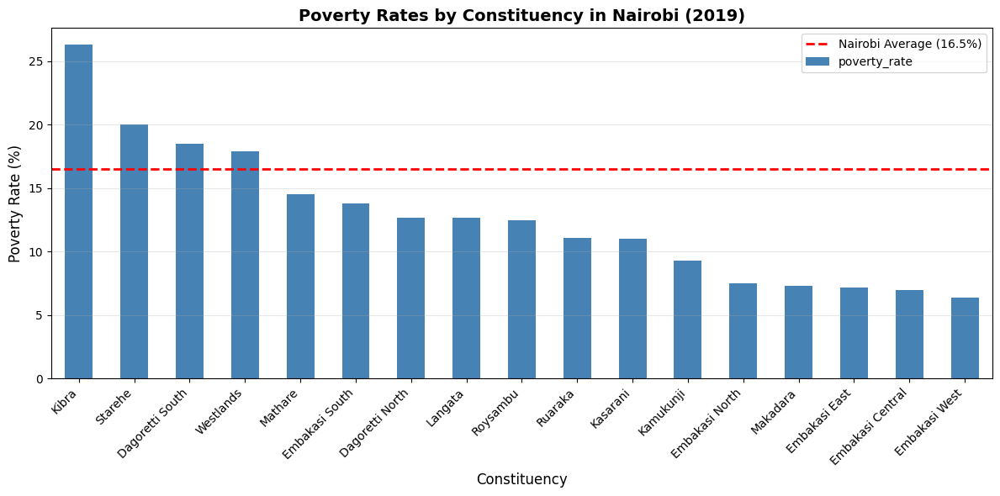

In [11]:
import matplotlib.pyplot as plt

# Sort by poverty rate for better visualization
poverty_lvl = poverty_lvl.sort_values('poverty_rate', ascending=False)

# Create bar plot
fig, ax = plt.subplots(figsize=(12, 6))
poverty_lvl.plot(
    x='constituency', 
    y='poverty_rate', 
    kind='bar', 
    ax=ax,
    color='steelblue',
    legend=False
)

# Customize
ax.set_title('Poverty Rates by Constituency in Nairobi (2019)', fontsize=14, fontweight='bold')
ax.set_xlabel('Constituency', fontsize=12)
ax.set_ylabel('Poverty Rate (%)', fontsize=12)
ax.axhline(y=16.5, color='red', linestyle='--', linewidth=2, label='Nairobi Average (16.5%)')
ax.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', alpha=0.3)
plt.show()

In [12]:
import geopandas as gpd
from shapely import wkt

# Convert WKT strings to shapely geometries
wards_nbo_pop['geometry'] = wards_nbo_pop['geometry'].apply(wkt.loads)

# Now create the GeoDataFrame
wards_nbo_pop = gpd.GeoDataFrame(wards_nbo_pop, geometry='geometry', crs='EPSG:4326')

mapping constituencies to wards_nbo_pop df, merging for `porverty_rate`

In [13]:
import pandas as pd
import geopandas as gpd  # Assuming wards_full_gdf is a GeoDataFrame

# Assuming your wards_full_gdf has a column named 'sub_county' (adjust if the actual column name differs, e.g., 'SUB_COUNTY' or 'Sub County')
# Also assuming poverty_lvl has columns 'constituency' and 'poverty_rate'

# Step 1: Function to match sub_county to constituency by stripping ' Sub County'
def get_constituency(sub_county):
    if pd.isna(sub_county):
        return sub_county
    return str(sub_county).replace(' Sub County', '').strip()

# Apply the function to create a 'constituency' column
wards_nbo_pop['constituency'] = wards_nbo_pop['subcounty'].apply(get_constituency)  # Replace 'sub_county' with actual column name if different

# Step 2: Join on constituency to add poverty_rate
wards_nbo_pop = wards_nbo_pop.merge(
    poverty_lvl,
    on='constituency',
    how='left'
)

# Now wards_full_gdf has the 'poverty_rate' column added
# You can proceed with visualization or further analysis, e.g.:
# wards_full_gdf.explore(column='poverty_rate', cmap='RdYlGn_r', legend=True)

visualisation

In [14]:
import folium
import geopandas as gpd
from folium import plugins

# --- Ensure CRS is WGS84 ---
wards_full_gdf = wards_nbo_pop.to_crs('EPSG:4326')

# --- Compute the map center dynamically from the dataset centroid ---
center = wards_nbo_pop.geometry.union_all().centroid
m = folium.Map(location=[center.y, center.x], zoom_start=11, tiles='CartoDB positron')

# --- Choropleth layer: Poverty rates by subcounty ---
folium.Choropleth(
    geo_data=wards_full_gdf,
    data=wards_full_gdf,
    columns=['subcounty', 'poverty_rate'],
    key_on='feature.properties.subcounty',
    fill_color='RdYlGn_r',  # Red = high poverty, Green = low
    fill_opacity=0.7,
    line_opacity=0.4,
    legend_name='Poverty Rate (%)',
    nan_fill_color='white'
).add_to(m)

# --- GeoJSON layer with hover tooltips (using your actual columns) ---
folium.GeoJson(
    wards_full_gdf,
    name='Wards',
    style_function=lambda x: {
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    },
    highlight_function=lambda x: {
        'weight': 2,
        'color': 'blue',
        'fillOpacity': 0.2
    },
    tooltip=folium.features.GeoJsonTooltip(
        fields=['county', 'subcounty', 'ward', 'constituency', 'pop2009', 'population', 'poverty_rate'],
        aliases=['County:', 'Subcounty:', 'Ward:', 'Constituency:', 'Pop (2009):', 'Current Pop:', 'Poverty Rate (%):'],
        localize=True,
        sticky=True,
        labels=True,
        style=(
            "background-color: rgba(255, 255, 255, 0.9); "
            "border: 1px solid #ccc; border-radius: 3px; "
            "padding: 5px; font-size: 10pt;"
        )
    )
).add_to(m)

# --- Controls for interactivity ---
folium.LayerControl().add_to(m)
plugins.MeasureControl().add_to(m)
plugins.Fullscreen().add_to(m)

# --- Display ---
m

###  vi. Coverage (Spatial)

#### Step 1: Prepare Ward Geography
- Convert ward geometries from WKT format to GeoDataFrame with proper coordinate reference system (CRS).

In [15]:
# import geopandas as gpd
# from shapely import wkt

# # Convert WKT strings to shapely geometries
# wards_nbo_pop['geometry'] = wards_nbo_pop['geometry'].apply(wkt.loads)

# # Now create the GeoDataFrame
# wards_nbo_pop = gpd.GeoDataFrame(wards_nbo_pop, geometry='geometry', crs='EPSG:4326')

#### Step 2: Create GTFS Stops GeoDataFrame
- Convert transit stops from GTFS feed to geographic points with latitude/longitude coordinates.

In [16]:
# GTFS stops to crs
stops = feed.stops
stops_gdf = gpd.GeoDataFrame(
    stops,
    geometry=gpd.points_from_xy(stops.stop_lon, stops.stop_lat),
    crs="EPSG:4326"
)

#### Step 3: Create Service Area Buffers
- Buffer each stop by 500m (walkable distance) in projected CRS for accurate distance measurement, then dissolve overlapping buffers into unified coverage areas.

In [17]:
# Project stops to metric CRS for accurate buffering
stops_proj = stops_gdf.to_crs(32737)  # UTM 37S for Nairobi

# Buffer each stop by 500 meters
stops_proj['geometry'] = stops_proj.buffer(500)

# Convert back to WGS84
all_service_areas_gdf = stops_proj.to_crs(4326)

print(f"Created {len(all_service_areas_gdf)} service areas using 500m buffers")

Created 4284 service areas using 500m buffers


#### Step 4: Dissolve Overlapping Buffers
- Merge all 500m buffers into a single unified coverage area to avoid double-counting overlapping service zones when calculating ward coverage.

In [18]:
# Dissolve to remove overlaps
coverage_union = all_service_areas_gdf.dissolve()

#### Step 5: Calculate Ward-Level Coverage
- Calculate how much of each ward's area is within 500m of transit stops, then estimate population served based on area coverage ratio.

In [19]:
# Project to UTM for accurate area calculations
proj_crs = 32737  # UTM Zone 37S for Nairobi
wards_proj = wards_nbo_pop.to_crs(proj_crs)
coverage_union_proj = coverage_union.to_crs(proj_crs)

# Calculate intersection area
wards_proj['intersect_area'] = wards_proj.geometry.intersection(
    coverage_union_proj.union_all()  # Fixed: use union_all() instead of unary_union
).area

# Calculate ward area and coverage ratio
wards_proj['ward_area'] = wards_proj.geometry.area
wards_proj['coverage_ratio'] = (
    wards_proj['intersect_area'] / wards_proj['ward_area']
).fillna(0).clip(0, 1)

# Estimate population served
wards_proj['pop_served'] = wards_proj['population'] * wards_proj['coverage_ratio']
wards_proj['pct_access'] = 100 * wards_proj['pop_served'] / wards_proj['population']

# Sort by coverage
coverage_summary = wards_proj[['ward', 'population', 'pop_served', 'pct_access']].copy()
coverage_summary = coverage_summary.sort_values('pct_access', ascending=False)

In [20]:
wards_proj.head(2)

,gid,pop2009,county,subcounty,ward,uid,scuid,cuid,geometry,population,constituency,poverty_rate,intersect_area,ward_area,coverage_ratio,pop_served,pct_access
0,2044,55158.0,Nairobi,Ruaraka Sub County,Mathare North Ward,dOQTHZsuaIb,Cc8uEFkzfVf,jkG3zaihdSs,"POLYGON ((263712.094 9861509.927, 263673.142 9...",74177.992829,Ruaraka,11.1,4.096217e+05,4.635465e+05,0.883669,65548.802666,88.366913
1,2047,70641.0,Nairobi,Embakasi South Sub County,Imara Daima Ward,Nt7PPe0Vdou,aDp1odOWYC1,jkG3zaihdSs,"POLYGON ((264030.489 9855064.997, 264031.152 9...",92557.211478,Embakasi South,13.8,2.646837e+06,3.914392e+06,0.676181,62585.423418,67.618095


In [21]:
coverage_summary.head(2)

,ward,population,pop_served,pct_access
62,Umoja Ii Ward,61300.688951,61300.688951,100.0
67,Eastleigh North Ward,55218.353508,55218.353508,100.0


In [22]:
print(f"\nOverall coverage:")
print(f"Total population: {wards_proj['population'].sum():,.0f}")
print(f"Population served: {wards_proj['pop_served'].sum():,.0f}")
print(f"Overall coverage: {100 * wards_proj['pop_served'].sum() / wards_proj['population'].sum():.1f}%")


Overall coverage:
Total population: 5,214,207
Population served: 3,734,156
Overall coverage: 71.6%


#### Step 6: Prepare Analysis DataFrames
- Create two dataframes: (1) clean summary table with ward coverage metrics, (2) full GeoDataFrame with all ward attributes plus coverage data.

In [23]:
# DataFrame 1: Ward coverage metrics (separate, clean dataframe)
coverage_df = pd.DataFrame({
    'ward': wards_proj['ward'],
    'county': wards_proj['county'],
    'subcounty': wards_proj['subcounty'],
    'population': wards_proj['population'],
    'ward_area_km2': wards_proj['ward_area'] / 1_000_000,  # Convert to km2
    'coverage_area_km2': wards_proj['intersect_area'] / 1_000_000,
    'coverage_ratio': wards_proj['coverage_ratio'],
    'pop_served': wards_proj['pop_served'].round(0).astype(int),
    'pop_not_served': (wards_proj['population'] - wards_proj['pop_served']).round(0).astype(int),
    'pct_access': wards_proj['pct_access'].round(2)
}).sort_values('pct_access', ascending=False).reset_index(drop=True)

print("\nCoverage Summary DataFrame:")
coverage_df.head(2)


Coverage Summary DataFrame:


,ward,county,subcounty,population,ward_area_km2,coverage_area_km2,coverage_ratio,pop_served,pop_not_served,pct_access
0,Umoja I Ward,Nairobi,Embakasi West Sub County,62143.091743,1.466308,1.466308,1.0,62143,0,100.0
1,Eastleigh North Ward,Nairobi,Kamukunji Sub County,55218.353508,0.877634,0.877634,1.0,55218,0,100.0


In [24]:
# DataFrame 2: Full ward geodataframe with all original + coverage data (joined)
wards_full_gdf = wards_proj.copy()
wards_full_gdf['coverage_area_km2'] = wards_full_gdf['intersect_area'] / 1_000_000
wards_full_gdf['pop_not_served'] = (wards_full_gdf['population'] - wards_full_gdf['pop_served']).round(0)

print(f"\nFull GeoDataFrame columns: {list(wards_full_gdf.columns)}")
print(f"Shape: {wards_full_gdf.shape}")
wards_full_gdf.head(2)


Full GeoDataFrame columns: ['gid', 'pop2009', 'county', 'subcounty', 'ward', 'uid', 'scuid', 'cuid', 'geometry', 'population', 'constituency', 'poverty_rate', 'intersect_area', 'ward_area', 'coverage_ratio', 'pop_served', 'pct_access', 'coverage_area_km2', 'pop_not_served']
Shape: (85, 19)


,gid,pop2009,county,subcounty,ward,uid,scuid,cuid,geometry,population,constituency,poverty_rate,intersect_area,ward_area,coverage_ratio,pop_served,pct_access,coverage_area_km2,pop_not_served
0,2044,55158.0,Nairobi,Ruaraka Sub County,Mathare North Ward,dOQTHZsuaIb,Cc8uEFkzfVf,jkG3zaihdSs,"POLYGON ((263712.094 9861509.927, 263673.142 9...",74177.992829,Ruaraka,11.1,4.096217e+05,4.635465e+05,0.883669,65548.802666,88.366913,0.409622,8629.0
1,2047,70641.0,Nairobi,Embakasi South Sub County,Imara Daima Ward,Nt7PPe0Vdou,aDp1odOWYC1,jkG3zaihdSs,"POLYGON ((264030.489 9855064.997, 264031.152 9...",92557.211478,Embakasi South,13.8,2.646837e+06,3.914392e+06,0.676181,62585.423418,67.618095,2.646837,29972.0


In [25]:
wards_full_gdf.subcounty.unique()

array(['Ruaraka  Sub County', 'Embakasi South Sub County',
       'Westlands  Sub County', 'Dagoretti North Sub County',
       'Kibra  Sub County', 'Roysambu  Sub County',
       'Kasarani  Sub County', 'Embakasi East Sub County',
       'Makadara  Sub County', 'Kamukunji  Sub County',
       'Starehe  Sub County', 'Mathare  Sub County',
       'Dagoretti South Sub County', 'Langata  Sub County',
       'Embakasi North Sub County', 'Embakasi West Sub County',
       'Embakasi Central Sub County'], dtype=object)

#### Step 7: Prepare Map Layers
- Convert all geographic layers to WGS84 (lat/lon) for web mapping, extract Nairobi boundary, and calculate map center point for visualization.

In [26]:
# Convert to WGS84 for mapping
wards_map = wards_proj.to_crs(4326)
coverage_union_map = coverage_union.to_crs(4326)
stops_map = stops_gdf.to_crs(4326)

# Get Nairobi county boundary for context
nairobi_boundary = wards_map.dissolve()

# Calculate map center
center_lat = stops_map.geometry.y.mean()
center_lon = stops_map.geometry.x.mean()

In [33]:
wards_full_gdf.to_csv('/home/dataopske/Desktop/jav/data/processed/wards_full_gdf.csv', index=False)

#### Step 8: Create Interactive Coverage Map

Build a comprehensive Folium map showing:
- **Ward heatmap**: Color-coded by coverage percentage with detailed tooltips (population, area, coverage metrics)
- **Toggleable layers**: Service coverage buffers, transit stops, and Nairobi boundary
- Enables interactive exploration of transit accessibility across all wards

In [28]:
# Format columns for better display
wards_map_display = wards_map.copy()
wards_map_display['Population'] = wards_map_display['population'].apply(lambda x: f'{int(x):,}')
wards_map_display['Pop_Served'] = wards_map_display['pop_served'].apply(lambda x: f'{int(x):,}')
wards_map_display['Coverage_%'] = wards_map_display['pct_access'].apply(lambda x: f'{x:.1f}%')
wards_map_display['Coverage_Ratio'] = wards_map_display['coverage_ratio'].apply(lambda x: f'{x:.2f}')
wards_map_display['Ward_Area_km²'] = (wards_map_display['ward_area'] / 1_000_000).apply(lambda x: f'{x:.2f}')
wards_map_display['Covered_Area_km²'] = (wards_map_display['intersect_area'] / 1_000_000).apply(lambda x: f'{x:.2f}')
wards_map_display['Intersect_Area_km²'] = (wards_map_display['intersect_area'] / 1_000_000).apply(lambda x: f'{x:.2f}')

# Start with clean heatmap base - with ALL table information
m4 = wards_map_display.explore(
    column='pct_access',
    cmap='YlOrRd',
    legend=True,
    legend_kwds={'caption': 'Population Coverage (%)'},
    tooltip=[
        'ward', 
        'county', 
        'subcounty', 
        'Population',
        'poverty_rate',
        'Pop_Served',
        'Coverage_%',
        'Coverage_Ratio',
        'Ward_Area_km²',
        'Intersect_Area_km²'
        
    ],
    popup=[
        'ward', 
        'county', 
        'subcounty', 
        'Population',
        'poverty_rate',
        'Pop_Served',
        'Coverage_%',
        'Coverage_Ratio',
        'Ward_Area_km²',
        'Covered_Area_km²',
        'Intersect_Area_km²',
        'pop2009',
        'gid'
    ],
    style_kwds={'color': 'black', 'weight': 0.5},
    tiles='CartoDB positron',
    name='Ward Coverage'
)

# Add toggleable layers
# Service coverage buffers (hidden by default)
coverage_layer = folium.FeatureGroup(name='Service Coverage Areas', show=False)
folium.GeoJson(
    coverage_union_map,
    style_function=lambda x: {
        "fillColor": "#4287f5",
        "color": "#2a5fc4",
        "weight": 2,
        "fillOpacity": 0.3,
    }
).add_to(coverage_layer)
coverage_layer.add_to(m4)

# Transit stops (hidden by default)
stops_layer = folium.FeatureGroup(name='Transit Stops', show=False)
for idx, row in stops_map.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=4,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.8,
        popup=f"Stop: {row.stop_name if 'stop_name' in row else row.stop_id}"
    ).add_to(stops_layer)
stops_layer.add_to(m4)

# Nairobi boundary (hidden by default)
boundary_layer = folium.FeatureGroup(name='Nairobi Boundary', show=False)
folium.GeoJson(
    nairobi_boundary,
    style_function=lambda x: {
        "fillColor": "none",
        "color": "#333333",
        "weight": 3,
        "fillOpacity": 0,
    }
).add_to(boundary_layer)
boundary_layer.add_to(m4)

# Add layer control to toggle everything
folium.LayerControl(position='topright', collapsed=False).add_to(m4)

display(m4)

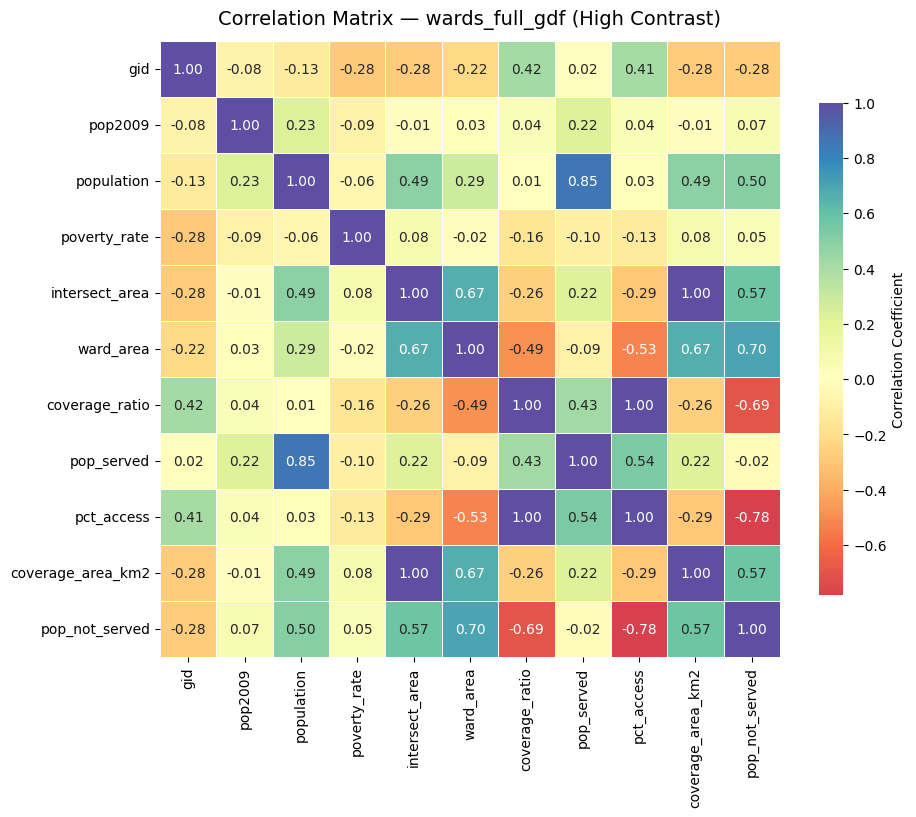

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns
numeric_df = wards_full_gdf.select_dtypes(include='number')

# Compute correlation matrix
corr_matrix = numeric_df.corr()

# Plot high-contrast correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='Spectral',     # or try 'RdYlBu_r', 'rocket_r', 'coolwarm'
    center=0,
    linewidths=0.5,
    cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'}
)
plt.title("Correlation Matrix — wards_full_gdf (High Contrast)", fontsize=14, pad=12)
plt.show()


> There is very low correlation between `poverty_levels` and `coverage_ratio`, or with just anything which is unexpected!

In [30]:
print("\n" + "="*60)
print("COVERAGE ANALYSIS SUMMARY")
print("="*60)

print(f"\nTotal Population: {coverage_df['population'].sum():,.0f}")
print(f"Population Served: {coverage_df['pop_served'].sum():,.0f}")
print(f"Population NOT Served: {coverage_df['pop_not_served'].sum():,.0f}")
print(f"Overall Coverage: {coverage_df['pct_access'].mean():.1f}%")

print(f"\n Ward Statistics:")
print(f"  - Wards with >80% coverage: {(coverage_df['pct_access'] > 80).sum()}")
print(f"  - Wards with 50-80% coverage: {((coverage_df['pct_access'] >= 50) & (coverage_df['pct_access'] <= 80)).sum()}")
print(f"  - Wards with <50% coverage: {(coverage_df['pct_access'] < 50).sum()}")

print(f"\n Top 5 Best Covered Wards:")
print(coverage_df.head(5)[['ward', 'pct_access', 'pop_served', 'population']].to_string(index=False))

print(f"\n Bottom 5 Worst Covered Wards:")
print(coverage_df.tail(5)[['ward', 'pct_access', 'pop_served', 'population']].to_string(index=False))

print("\n" + "="*60)
print("✓ Analysis complete! All maps displayed above.")
print("="*60)

# Export dataframes
coverage_df.to_csv('coverage_summary.csv', index=False)
wards_full_gdf.to_file('wards_with_coverage.geojson', driver='GeoJSON')
print("\n Exported files:")
print("  - coverage_summary.csv (metrics only)")
print("  - wards_with_coverage.geojson (full geodataframe)")

print("\n Available dataframes:")
print("  - coverage_df: Clean metrics dataframe")
print("  - wards_full_gdf: Full geodataframe with all data")


COVERAGE ANALYSIS SUMMARY

Total Population: 5,214,207
Population Served: 3,734,158
Population NOT Served: 1,480,051
Overall Coverage: 71.2%

 Ward Statistics:
  - Wards with >80% coverage: 37
  - Wards with 50-80% coverage: 22
  - Wards with <50% coverage: 15

 Top 5 Best Covered Wards:
                ward  pct_access  pop_served   population
        Umoja I Ward       100.0       62143 62143.091743
Eastleigh North Ward       100.0       55218 55218.353508
Nairobi Central Ward       100.0       18997 18997.268882
     Ngara Ward Ward       100.0       25590 25589.814342
   Kayole North Ward       100.0       67395 67394.965603

 Bottom 5 Worst Covered Wards:
               ward  pct_access  pop_served  population
Dandora Area I Ward         NaN           0         0.0
Kayole Central Ward         NaN           0         0.0
    Ziwani/kariokor         NaN           0         0.0
          Ngei Ward         NaN           0         0.0
       Mlango Kubwa         NaN           0       

In [31]:
coverage_df.loc[coverage_df['pct_access'] < 50]

,ward,county,subcounty,population,ward_area_km2,coverage_area_km2,coverage_ratio,pop_served,pop_not_served,pct_access
59,Uthiru/ruthimitu Ward,Nairobi,Dagoretti South Sub County,54875.676776,7.897694,3.936834,0.498479,27354,27521,49.85
60,Njiru Ward,Nairobi,Kasarani Sub County,69402.068216,8.032795,3.792955,0.472184,32771,36632,47.22
61,Airbase Ward,Nairobi,Kamukunji Sub County,105433.255157,5.031615,2.315321,0.460155,48516,56918,46.02
62,Waithaka Ward,Nairobi,Dagoretti South Sub County,33981.409844,4.975065,2.014952,0.405010,13763,20219,40.50
63,Githurai Ward,Nairobi,Roysambu Sub County,52515.024087,1.551637,0.599742,0.386522,20298,32217,38.65
64,Karen Ward,Nairobi,Langata Sub County,90123.859078,71.393301,27.485870,0.384992,34697,55427,38.50
65,Mihango Ward,Nairobi,Embakasi East Sub County,22000.263966,14.922689,4.735047,0.317305,6981,15019,31.73
66,Zimmerman Ward,Nairobi,Roysambu Sub County,41029.548004,7.129172,2.186430,0.306688,12583,28446,30.67
67,Kahawa West,Nairobi,Roysambu Sub County,57375.096470,13.886730,4.217763,0.303726,17426,39949,30.37
68,Mutu-ini Ward,Nairobi,Dagoretti South Sub County,13290.856101,5.016310,1.256918,0.250566,3330,9961,25.06
